## An Advanced Panorama Stitching Framework with Cylindrical Projection, Multi-Blend Strategies, and Homography Caching

#### Imports Required libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

#### Create output directory

In [2]:
OUTPUT_DIR = Path("./panorama_outputs")
OUTPUT_DIR.mkdir(exist_ok=True)
print(f"All visuals will be saved in {OUTPUT_DIR}")

All visuals will be saved in panorama_outputs


#### Helper: Show & Save

In [3]:
def show_and_save(img, title, filename):
    plt.figure(figsize=(12,6))
    if len(img.shape) == 2:
        plt.imshow(img, cmap="gray")
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()
    cv2.imwrite(str(OUTPUT_DIR/filename), img)

#### Helper: Draw Matches

In [4]:

def draw_matches(img1, kp1, img2, kp2, matches, max_matches=50):
    match_img = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:max_matches], None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    return match_img

#### Load Images

In [5]:
def load_images(folder="./samples"):
    exts = (".jpg",".jpeg",".png",".bmp")
    paths = sorted([str(Path(folder)/f) for f in os.listdir(folder) if f.lower().endswith(exts)])
    imgs = [cv2.imread(p) for p in paths]
    return imgs, paths

imgs, paths = load_images("./samples")
print("Loaded images:", paths)

Loaded images: ['samples\\test_sample_1A.jpg', 'samples\\test_sample_1B.jpg']


#### Show Input Images

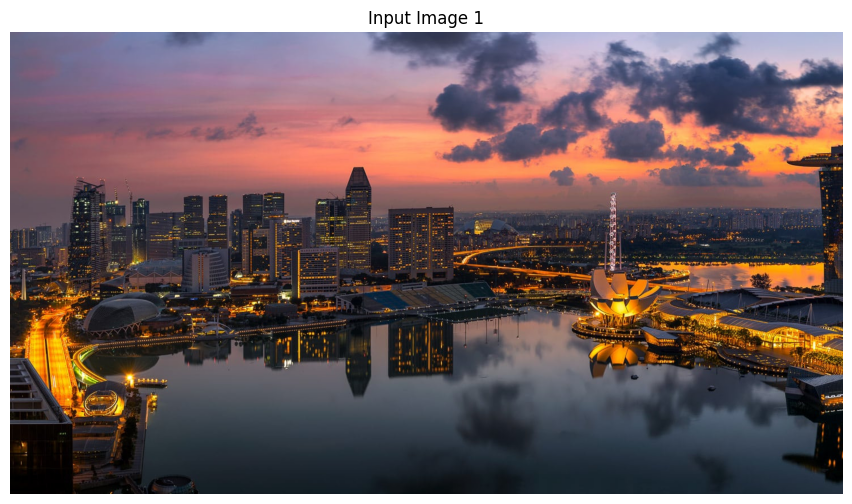

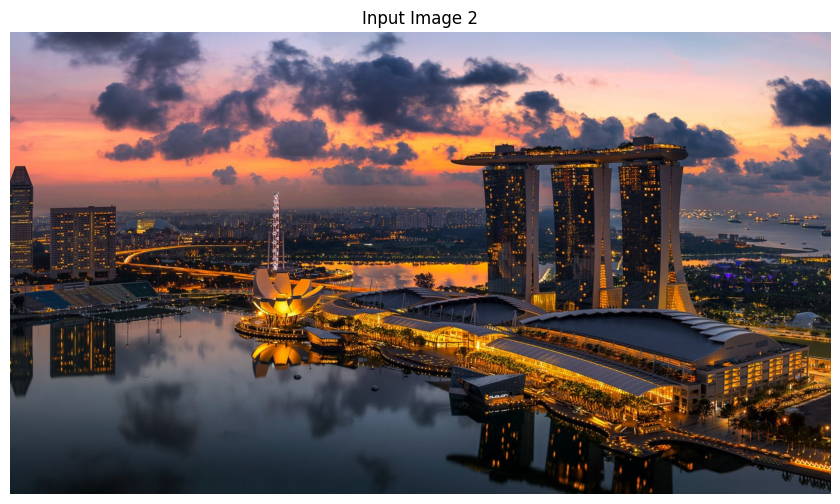

In [6]:
for i, img in enumerate(imgs):
    show_and_save(img, f"Input Image {i+1}", f"input_{i+1}.jpg")

#### Extract SIFT Features

In [7]:
def extract_sift(img):
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(img, None)
    return kp, des

kp1, des1 = extract_sift(imgs[0])
kp2, des2 = extract_sift(imgs[1])
print(f"Features Image1: {len(kp1)} | Image2: {len(kp2)}")

Features Image1: 4922 | Image2: 6086


#### Visualize SIFT Keypoints

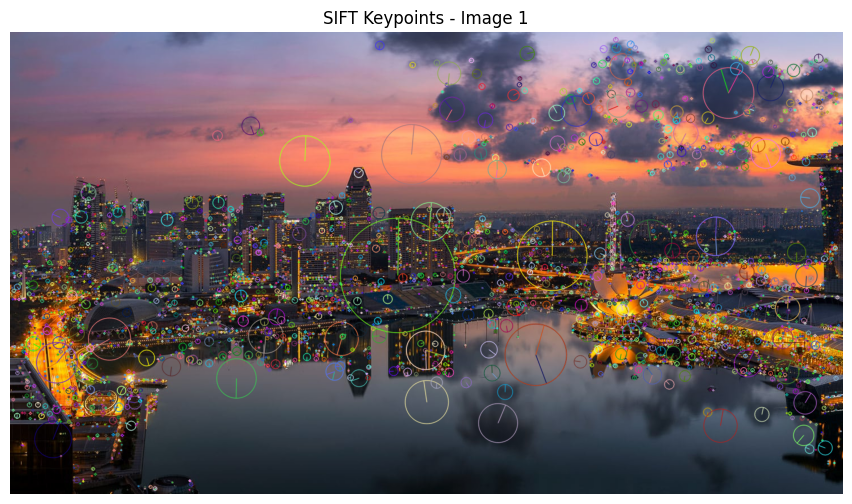

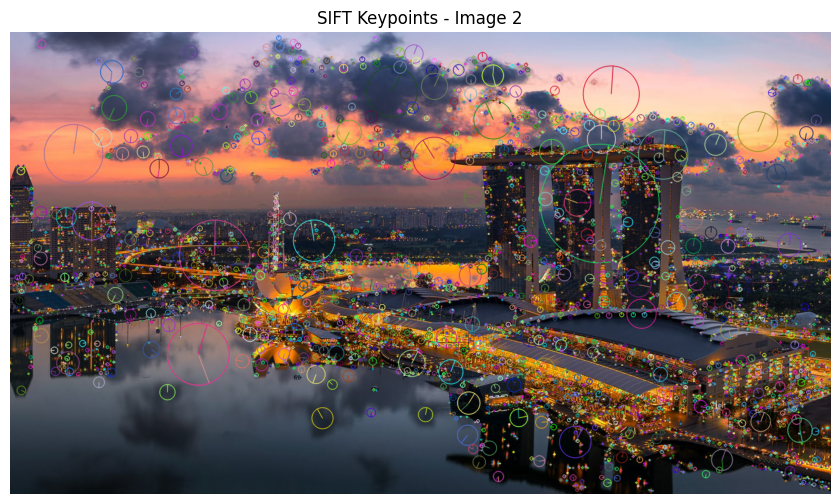

In [8]:
img_kp1 = cv2.drawKeypoints(imgs[0], kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
show_and_save(img_kp1, "SIFT Keypoints - Image 1", "sift_features_img1.jpg")

img_kp2 = cv2.drawKeypoints(imgs[1], kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
show_and_save(img_kp2, "SIFT Keypoints - Image 2", "sift_features_img2.jpg")

#### BF Matcher

In [9]:
def match_bf(des1, des2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    return matches

bf_matches = match_bf(des1, des2)
print("BF Matches:", len(bf_matches))

BF Matches: 2696


#### Visualize BF Matches

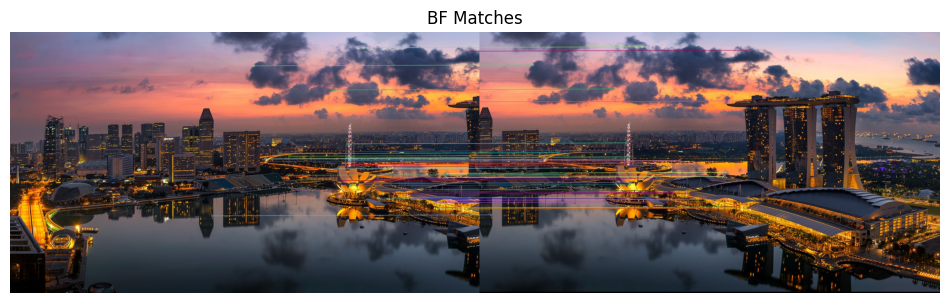

In [10]:
bf_img = draw_matches(imgs[0], kp1, imgs[1], kp2, bf_matches, max_matches=50)
show_and_save(bf_img, "BF Matches", "bf_matches.jpg")

#### KNN Matcher (Lowe's Ratio Test)

In [11]:
def match_knn(des1, des2, ratio=0.75):
    bf = cv2.BFMatcher(cv2.NORM_L2)
    raw_matches = bf.knnMatch(des1, des2, k=2)
    good = []
    for m,n in raw_matches:
        if m.distance < ratio * n.distance:
            good.append(m)
    return good, raw_matches

knn_good, knn_raw = match_knn(des1, des2)
print(f"KNN Matches (after ratio test): {len(knn_good)} / Raw: {len(knn_raw)}")

KNN Matches (after ratio test): 2192 / Raw: 4922


#### Visualize KNN Matches (Raw)

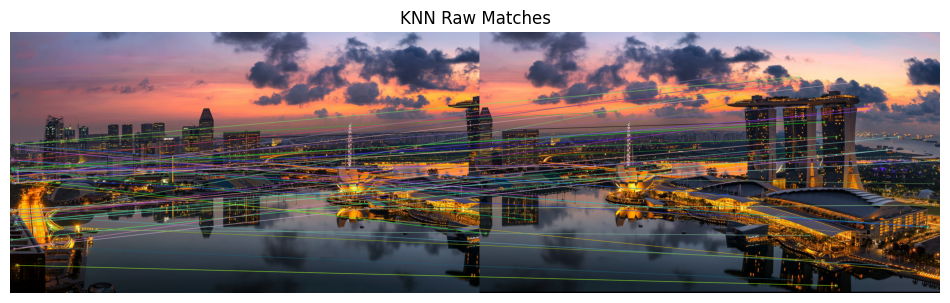

In [12]:
knn_img_raw = draw_matches(imgs[0], kp1, imgs[1], kp2, [m[0] for m in knn_raw], max_matches=50)
show_and_save(knn_img_raw, "KNN Raw Matches", "knn_raw_matches.jpg")

#### Compute Homography (RANSAC)

In [13]:

def compute_homography(kp1, kp2, matches, ransac_thresh=4.0):
    if len(matches) < 4:
        return None, None
    ptsA = np.float32([kp1[m.queryIdx].pt for m in matches])
    ptsB = np.float32([kp2[m.trainIdx].pt for m in matches])
    H, status = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, ransac_thresh)
    return H, status

H, status = compute_homography(kp1, kp2, knn_good)
print("Homography Matrix:\n", H)
print("Inliers:", np.sum(status), "/", len(status))


Homography Matrix:
 [[ 9.99922944e-01  4.51969690e-05 -5.98973121e+02]
 [-3.35184067e-05  9.99936614e-01 -2.96239570e+00]
 [-9.65631898e-08  9.80955961e-08  1.00000000e+00]]
Inliers: 2169 / 2192


#### Visualize Inlier Matches

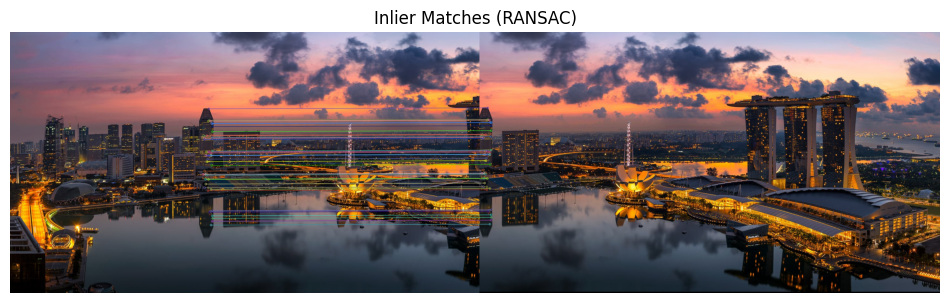

In [14]:
def draw_inliers(img1, kp1, img2, kp2, matches, status):
    inlier_matches = [m for i,m in enumerate(matches) if status[i]]
    return draw_matches(img1, kp1, img2, kp2, inlier_matches, max_matches=50)

if H is not None:
    inlier_img = draw_inliers(imgs[0], kp1, imgs[1], kp2, knn_good, status)
    show_and_save(inlier_img, "Inlier Matches (RANSAC)", "inlier_matches.jpg")

#### Warp Perspective (Stitch two images)

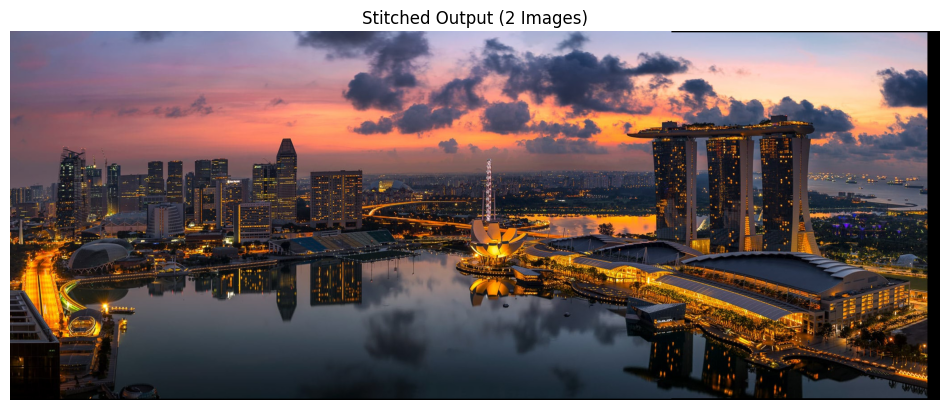

In [15]:
def stitch_two(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    corners = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(corners, H)
    all_corners = np.concatenate((corners, trans_corners), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    trans_dist = [-xmin, -ymin]
    Ht = np.array([[1,0,trans_dist[0]],[0,1,trans_dist[1]],[0,0,1]])
    result = cv2.warpPerspective(img1, Ht.dot(H), (xmax-xmin, ymax-ymin))
    result[trans_dist[1]:h2+trans_dist[1], trans_dist[0]:w2+trans_dist[0]] = img2
    return result

if H is not None:
    stitched = stitch_two(imgs[0], imgs[1], H)
    show_and_save(stitched, "Stitched Output (2 Images)", "stitched_pair.jpg")

#### Warp Perspective (Stitch two images)

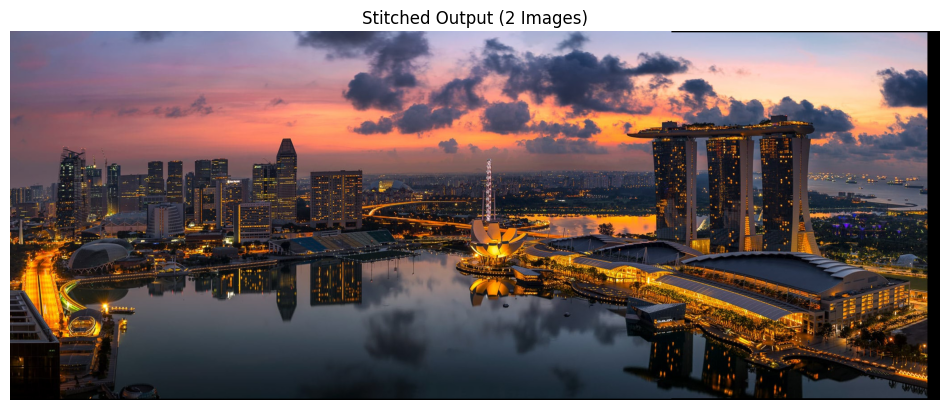

In [16]:
def stitch_two(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    corners = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    trans_corners = cv2.perspectiveTransform(corners, H)
    all_corners = np.concatenate((corners, trans_corners), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    trans_dist = [-xmin, -ymin]
    Ht = np.array([[1,0,trans_dist[0]],[0,1,trans_dist[1]],[0,0,1]])
    result = cv2.warpPerspective(img1, Ht.dot(H), (xmax-xmin, ymax-ymin))
    result[trans_dist[1]:h2+trans_dist[1], trans_dist[0]:w2+trans_dist[0]] = img2
    return result

if H is not None:
    stitched = stitch_two(imgs[0], imgs[1], H)
    show_and_save(stitched, "Stitched Output (2 Images)", "stitched_pair.jpg")

#### Overlay Matches and Panorama Inputs

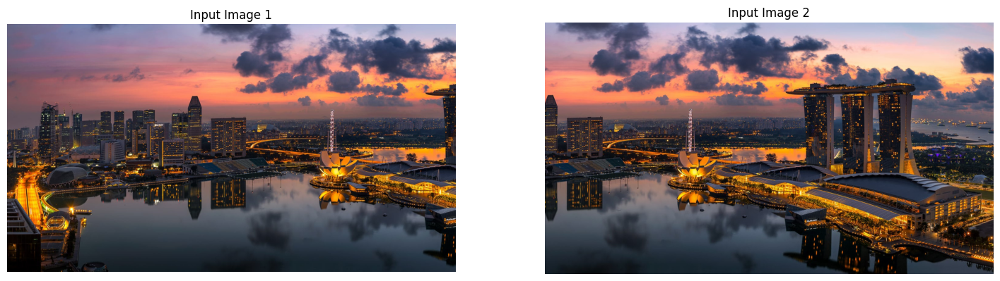

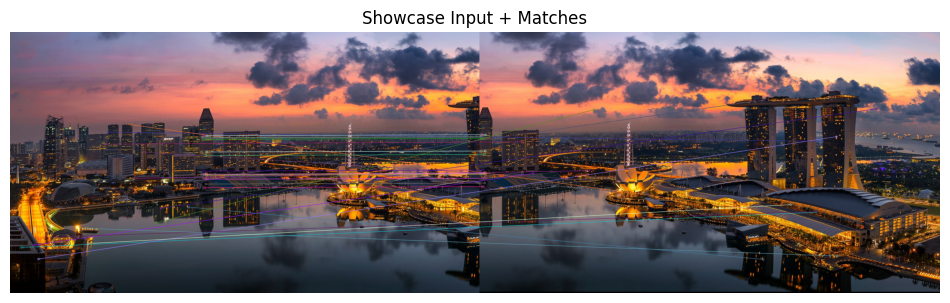

In [17]:
def showcase_input_and_matches(img1, img2, kp1, kp2, matches, title, filename):
    match_img = draw_matches(img1, kp1, img2, kp2, matches, max_matches=30)
    fig, axs = plt.subplots(1,2, figsize=(18,8))
    axs[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Input Image 1")
    axs[0].axis("off")
    axs[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axs[1].set_title("Input Image 2")
    axs[1].axis("off")
    plt.show()
    show_and_save(match_img, title, filename)

showcase_input_and_matches(imgs[0], imgs[1], kp1, kp2, knn_good, "Showcase Input + Matches", "showcase_inputs_matches.jpg")

#### Show Intermediate Panorama Progress

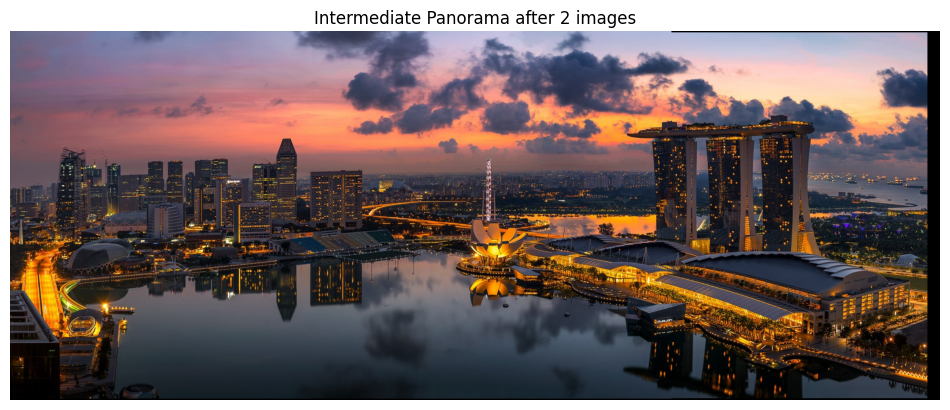

In [18]:
def show_intermediate(pano, step):
    plt.figure(figsize=(12,6))
    plt.imshow(cv2.cvtColor(pano, cv2.COLOR_BGR2RGB))
    plt.title(f"Intermediate Panorama after {step} images")
    plt.axis("off")
    plt.show()

if H is not None:
    show_intermediate(stitched, 2)

#### Function for Pairwise Stitching with Visualization

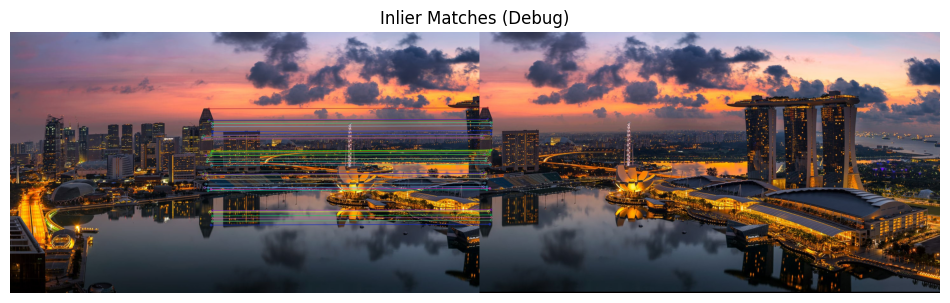

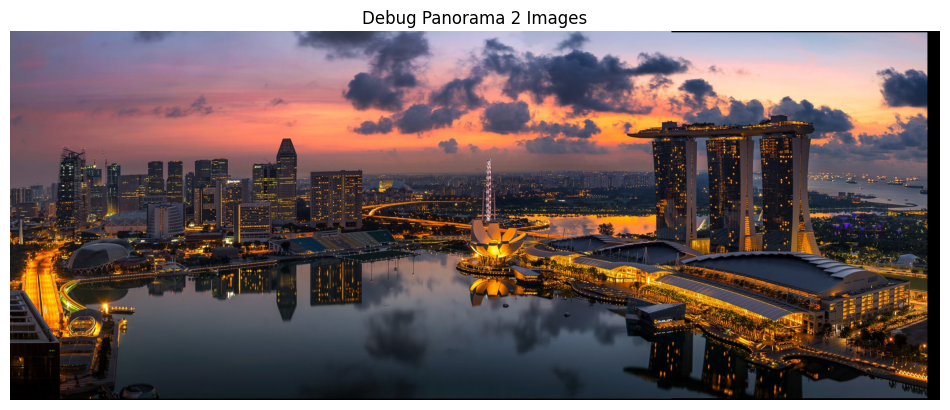

In [19]:
def stitch_with_visuals(img1, img2, debug=True):
    kp1, des1 = extract_sift(img1)
    kp2, des2 = extract_sift(img2)
    matches, _ = match_knn(des1, des2)
    H, status = compute_homography(kp1, kp2, matches)
    
    if H is None:
        raise ValueError("Homography could not be computed")
    
    if debug:
        inlier_img = draw_inliers(img1, kp1, img2, kp2, matches, status)
        show_and_save(inlier_img, "Inlier Matches (Debug)", "debug_inlier_matches.jpg")
    
    pano = stitch_two(img1, img2, H)
    return pano

debug_pano = stitch_with_visuals(imgs[0], imgs[1], debug=True)
show_and_save(debug_pano, "Debug Panorama 2 Images", "debug_pano_2.jpg")

#### Save Cleaned Final Panorama (2 Images)

In [20]:
if H is not None:
    cv2.imwrite(str(OUTPUT_DIR/"final_pano_2.jpg"), stitched)
    print("Final Panorama (2 images) saved as final_pano_2.jpg")

Final Panorama (2 images) saved as final_pano_2.jpg


#### Function to Stitch Sequence of Images

In [21]:
def stitch_sequence(images, debug=True):
    pano = images[0]
    for i in range(1, len(images)):
        pano = stitch_with_visuals(pano, images[i], debug=debug)
        if debug:
            show_intermediate(pano, i+1)
            cv2.imwrite(str(OUTPUT_DIR/f"pano_step_{i+1}.jpg"), pano)
    return pano

#### Run Multi-Image Stitching (using 3 sample images)

In [22]:
if len(imgs) >= 3:
    multi_pano = stitch_sequence(imgs[:3], debug=True)
    show_and_save(multi_pano, "Panorama with 3 Images", "multi_pano_3.jpg")

#### Run Multi-Image Stitching (using all sample images)

In [23]:
if len(imgs) > 2:
    final_pano = stitch_sequence(imgs, debug=True)
    show_and_save(final_pano, "Final Panorama (All Images)", "final_pano_all.jpg")

#### Save All Intermediate Steps in a Subfolder

In [24]:
intermediate_dir = OUTPUT_DIR / "intermediates"
intermediate_dir.mkdir(exist_ok=True)

if len(imgs) > 2:
    pano = imgs[0]
    for i in range(1, len(imgs)):
        pano = stitch_with_visuals(pano, imgs[i], debug=False)
        cv2.imwrite(str(intermediate_dir/f"intermediate_{i+1}.jpg"), pano)
print("Intermediate panoramas saved in intermediates/ folder")

Intermediate panoramas saved in intermediates/ folder


#### Plot Progression of Panorama Building

In [25]:
import glob

def plot_progression(folder):
    files = sorted(glob.glob(str(folder/"*.jpg")))
    n = len(files)
    if n == 0:
        print(f"No images found in {folder}, skipping progression plot.")
        return
    
    fig, axs = plt.subplots(1, n, figsize=(5*n, 6))
    if n == 1:
        axs = [axs]
    for i, file in enumerate(files):
        img = cv2.imread(file)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[i].imshow(img_rgb)
        axs[i].set_title(f"Step {i+1}")
        axs[i].axis("off")
    plt.show()

#### Overlay Final Panorama with Input Thumbnails

In [26]:
def overlay_inputs_and_pano(images, pano, filename="overlay_showcase.jpg"):
    fig, axs = plt.subplots(1, len(images)+1, figsize=(5*(len(images)+1), 6))
    for i, img in enumerate(images):
        axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[i].set_title(f"Input {i+1}")
        axs[i].axis("off")
    axs[-1].imshow(cv2.cvtColor(pano, cv2.COLOR_BGR2RGB))
    axs[-1].set_title("Final Panorama")
    axs[-1].axis("off")
    plt.tight_layout()
    plt.savefig(str(OUTPUT_DIR/filename))
    plt.show()

if 'final_pano' in locals():
    overlay_inputs_and_pano(imgs, final_pano)

#### Function for Cleaned Seamless Panorama

In [27]:
def cleaned_panorama(images, debug=False):
    pano = stitch_sequence(images, debug=debug)
    gray = cv2.cvtColor(pano, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = cv2.boundingRect(contours[0])
    pano_cropped = pano[y:y+h, x:x+w]
    return pano_cropped

if len(imgs) > 2:
    cropped_pano = cleaned_panorama(imgs, debug=True)
    show_and_save(cropped_pano, "Cropped Final Panorama", "final_pano_cropped.jpg")

#### Side-by-Side Before vs After Cropping

In [28]:

if len(imgs) > 2:
    fig, axs = plt.subplots(1,2, figsize=(16,8))
    axs[0].imshow(cv2.cvtColor(final_pano, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Before Cropping")
    axs[0].axis("off")
    axs[1].imshow(cv2.cvtColor(cropped_pano, cv2.COLOR_BGR2RGB))
    axs[1].set_title("After Cropping")
    axs[1].axis("off")
    plt.show()


#### Save Comparison Images

In [29]:
if len(imgs) > 2:
    cv2.imwrite(str(OUTPUT_DIR/"before_crop.jpg"), final_pano)
    cv2.imwrite(str(OUTPUT_DIR/"after_crop.jpg"), cropped_pano)
    print("Before/After Cropping panoramas saved.")

#### Confirm Outputs

In [30]:
import os
print("Files in OUTPUT_DIR:")
for f in os.listdir(OUTPUT_DIR):
    print(" -", f)

Files in OUTPUT_DIR:
 - bf_matches.jpg
 - debug_inlier_matches.jpg
 - debug_pano_2.jpg
 - final_pano_2.jpg
 - inlier_matches.jpg
 - input_1.jpg
 - input_2.jpg
 - intermediates
 - knn_raw_matches.jpg
 - showcase_inputs_matches.jpg
 - sift_features_img1.jpg
 - sift_features_img2.jpg
 - stitched_pair.jpg


#### Build warp canvas + masks (helper used by blends)

In [31]:
import numpy as np
import cv2

def warp_pair_to_canvas(img1, img2, H):
    """
    Warp img1 into img2 frame using H, return canvas images + 8-bit masks.
    """
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # corners of img1 and img2 (for bounds)
    corners1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    corners1_t = cv2.perspectiveTransform(corners1, H)
    corners2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)

    all_corners = np.concatenate((corners1_t, corners2), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    tx, ty = -xmin, -ymin
    Ht = np.array([[1,0,tx],[0,1,ty],[0,0,1]], dtype=np.float32)

    # warp img1 and mask
    canvas_w, canvas_h = xmax - xmin, ymax - ymin
    warped1 = cv2.warpPerspective(img1, Ht @ H, (canvas_w, canvas_h))
    mask1 = cv2.warpPerspective(np.ones((h1,w1), np.uint8)*255, Ht @ H, (canvas_w, canvas_h))

    # place img2 and mask2 on canvas
    canvas2 = np.zeros_like(warped1)
    canvas2[ty:ty+h2, tx:tx+w2] = img2
    mask2 = np.zeros((canvas_h, canvas_w), np.uint8)
    mask2[ty:ty+h2, tx:tx+w2] = 255

    return warped1, canvas2, mask1, mask2, (tx, ty), (canvas_w, canvas_h)

#### Visualize masks, overlap, and weights (before any blending)

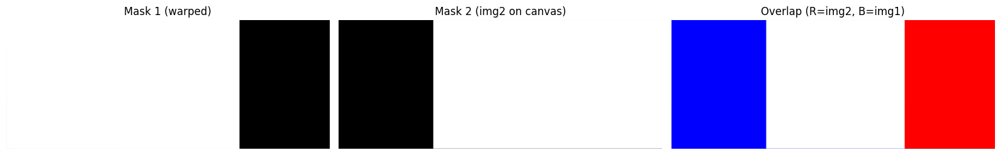

In [32]:
import matplotlib.pyplot as plt

def visualize_masks_and_overlap(mask1, mask2, title_prefix="pair"):
    overlap = cv2.bitwise_and(mask1, mask2)
    both = np.stack([mask2, overlap, mask1], axis=-1)  # RGB composite
    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1); plt.imshow(mask1, cmap='gray'); plt.title("Mask 1 (warped)"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(mask2, cmap='gray'); plt.title("Mask 2 (img2 on canvas)"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(both); plt.title("Overlap (R=img2, B=img1)"); plt.axis('off')
    plt.tight_layout(); plt.show()
    cv2.imwrite(str(OUTPUT_DIR/f"{title_prefix}_mask1.png"), mask1)
    cv2.imwrite(str(OUTPUT_DIR/f"{title_prefix}_mask2.png"), mask2)
    cv2.imwrite(str(OUTPUT_DIR/f"{title_prefix}_overlap_rgb.png"), both)

# Quick demo on the first pair if H exists
if 'H' in globals() and H is not None:
    w1c, w2c, m1c, m2c, _, _ = warp_pair_to_canvas(imgs[0], imgs[1], H)
    visualize_masks_and_overlap(m1c, m2c, title_prefix="pair1")

#### Feather blending (distance-transform weights) + visualization

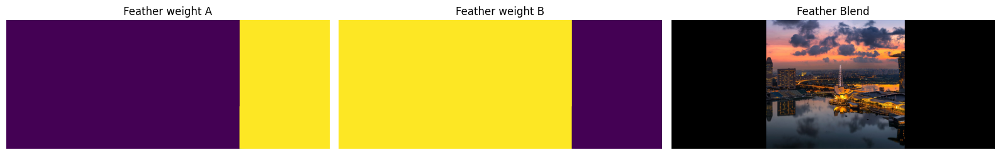

In [33]:
def feather_blend(imgA, imgB, maskA, maskB, eps=1e-6):
    """
    Feather blend using distance transforms for soft weights in overlap.
    imgA, imgB: same size (H,W,3), uint8
    maskA, maskB: same size (H,W), 0..255
    """
    A = imgA.astype(np.float32)
    B = imgB.astype(np.float32)

    # Normalize masks to [0,1]
    mA = (maskA > 0).astype(np.uint8)
    mB = (maskB > 0).astype(np.uint8)
    # Compute distance to border (for weights)
    dA = cv2.distanceTransform((mA==0).astype(np.uint8), cv2.DIST_L2, 3)
    dB = cv2.distanceTransform((mB==0).astype(np.uint8), cv2.DIST_L2, 3)
    wA = dA / (dA + dB + eps)
    wB = 1.0 - wA
    wA3 = wA[...,None]; wB3 = wB[...,None]

    out = A*wA3 + B*wB3
    out = np.clip(out, 0, 255).astype(np.uint8)
    return out, wA, wB

def stitch_two_feather(img1, img2, H):
    A, B, mA, mB, _, _ = warp_pair_to_canvas(img1, img2, H)
    blended, wA, wB = feather_blend(A, B, mA, mB)
    # Visualize weight maps
    plt.figure(figsize=(16,5))
    plt.subplot(1,3,1); plt.imshow(wA, cmap='viridis'); plt.title("Feather weight A"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(wB, cmap='viridis'); plt.title("Feather weight B"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB)); plt.title("Feather Blend"); plt.axis('off')
    plt.tight_layout(); plt.show()
    cv2.imwrite(str(OUTPUT_DIR/"feather_weights_A.png"), (wA*255).astype(np.uint8))
    cv2.imwrite(str(OUTPUT_DIR/"feather_weights_B.png"), (wB*255).astype(np.uint8))
    cv2.imwrite(str(OUTPUT_DIR/"feather_blend_pair.jpg"), blended)
    return blended

if 'H' in globals() and H is not None:
    feather_out = stitch_two_feather(imgs[0], imgs[1], H)

#### Multiband (Laplacian pyramid) blending

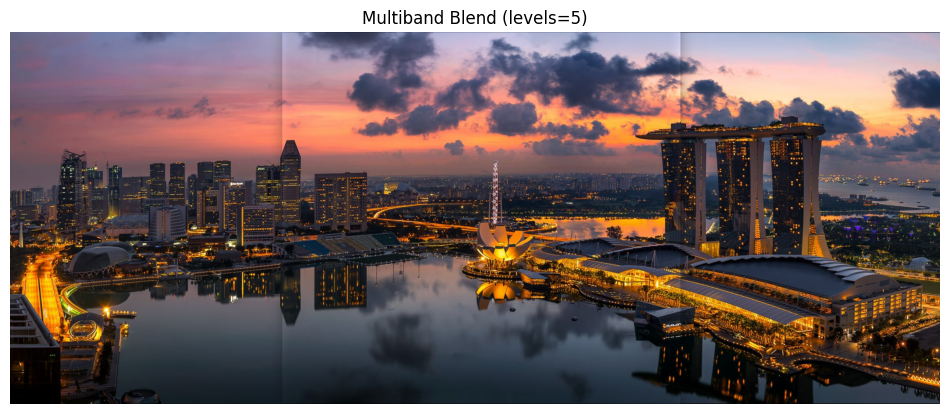

In [34]:
def multiband_blend(imgA, imgB, maskA, maskB, levels=5):
    """
    Laplacian pyramid blending with soft mask from maskA.
    We construct a blending mask = normalized Gaussian of maskA (1 for A, 0 for B).
    """
    A = imgA.astype(np.float32)
    B = imgB.astype(np.float32)
    mA = (maskA > 0).astype(np.float32)
    mB = (maskB > 0).astype(np.float32)
    # prefer balanced mask in overlap
    m = (mA / (mA + mB + 1e-6))  # in [0,1]
    m = cv2.GaussianBlur(m, (31,31), 0)

    # build Gaussian pyramids for mask
    Gm = [m]
    for _ in range(levels-1):
        Gm.append(cv2.pyrDown(Gm[-1]))

    # build Laplacian pyramids for A, B
    def build_laplacian(I, L):
        G = [I]
        for _ in range(L-1):
            G.append(cv2.pyrDown(G[-1]))
        LP = []
        for i in range(L-1):
            GE = cv2.pyrUp(G[i+1])
            GE = GE[:G[i].shape[0], :G[i].shape[1]]
            LP.append(G[i] - GE)
        LP.append(G[-1])
        return LP

    LA = build_laplacian(A, levels)
    LB = build_laplacian(B, levels)

    # blend each level
    LS = []
    for l in range(levels):
        gm = Gm[l]
        if gm.ndim == 2:
            gm = gm[...,None]
        # match channels
        gm3 = np.repeat(gm, 3, axis=2)
        la = LA[l]; lb = LB[l]
        # Align spatial sizes
        h = min(la.shape[0], lb.shape[0], gm3.shape[0])
        w = min(la.shape[1], lb.shape[1], gm3.shape[1])
        la = la[:h,:w]; lb = lb[:h,:w]; gm3 = gm3[:h,:w]
        ls = la*gm3 + lb*(1.0 - gm3)
        LS.append(ls)

    # collapse pyramid
    result = LS[-1]
    for l in range(levels-2, -1, -1):
        result = cv2.pyrUp(result)
        result = result[:LS[l].shape[0], :LS[l].shape[1]]
        result = result + LS[l]
    result = np.clip(result, 0, 255).astype(np.uint8)
    return result

def stitch_two_multiband(img1, img2, H, levels=5):
    A, B, mA, mB, _, _ = warp_pair_to_canvas(img1, img2, H)
    out = multiband_blend(A, B, mA, mB, levels=levels)
    cv2.imwrite(str(OUTPUT_DIR/f"multiband_pair_L{levels}.jpg"), out)
    plt.figure(figsize=(12,6)); plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    plt.title(f"Multiband Blend (levels={levels})"); plt.axis('off'); plt.show()
    return out

if 'H' in globals() and H is not None:
    multiband_out = stitch_two_multiband(imgs[0], imgs[1], H, levels=5)

#### Unified stitch with blend option: 'direct' | 'feather' | 'multiband'

In [35]:
def stitch_two_with_blend(img1, img2, H, blend='multiband', **kwargs):
    if blend == 'direct':
        return stitch_two(img1, img2, H)
    elif blend == 'feather':
        A, B, mA, mB, _, _ = warp_pair_to_canvas(img1, img2, H)
        out, _, _ = feather_blend(A, B, mA, mB)
        return out
    elif blend == 'multiband':
        return stitch_two_multiband(img1, img2, H, levels=kwargs.get('levels', 5))
    else:
        raise ValueError("Unknown blend type")

#### Visual comparison: direct vs feather vs multiband

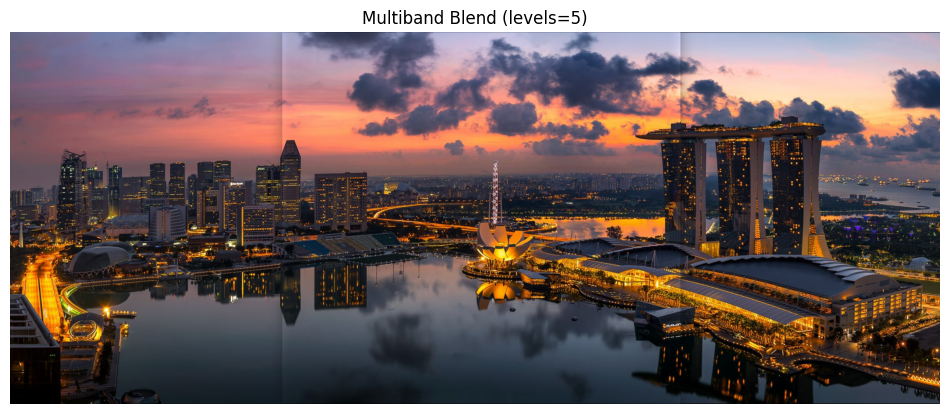

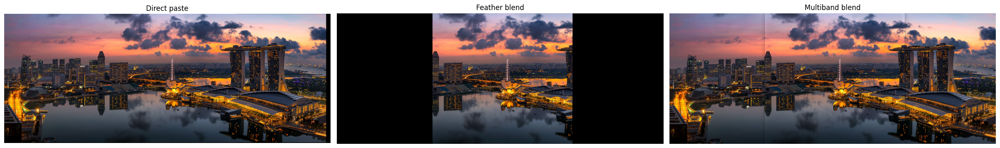

In [36]:
if 'H' in globals() and H is not None:
    direct = stitch_two_with_blend(imgs[0], imgs[1], H, blend='direct')
    feather = stitch_two_with_blend(imgs[0], imgs[1], H, blend='feather')
    multi   = stitch_two_with_blend(imgs[0], imgs[1], H, blend='multiband', levels=5)

    fig, axs = plt.subplots(1,3, figsize=(24,7))
    axs[0].imshow(cv2.cvtColor(direct, cv2.COLOR_BGR2RGB)); axs[0].set_title("Direct paste"); axs[0].axis('off')
    axs[1].imshow(cv2.cvtColor(feather, cv2.COLOR_BGR2RGB)); axs[1].set_title("Feather blend"); axs[1].axis('off')
    axs[2].imshow(cv2.cvtColor(multi,   cv2.COLOR_BGR2RGB)); axs[2].set_title("Multiband blend"); axs[2].axis('off')
    plt.tight_layout(); plt.show()

    cv2.imwrite(str(OUTPUT_DIR/"compare_direct.jpg"), direct)
    cv2.imwrite(str(OUTPUT_DIR/"compare_feather.jpg"), feather)
    cv2.imwrite(str(OUTPUT_DIR/"compare_multiband.jpg"), multi)

#### Simple exposure compensation (gain) before blending

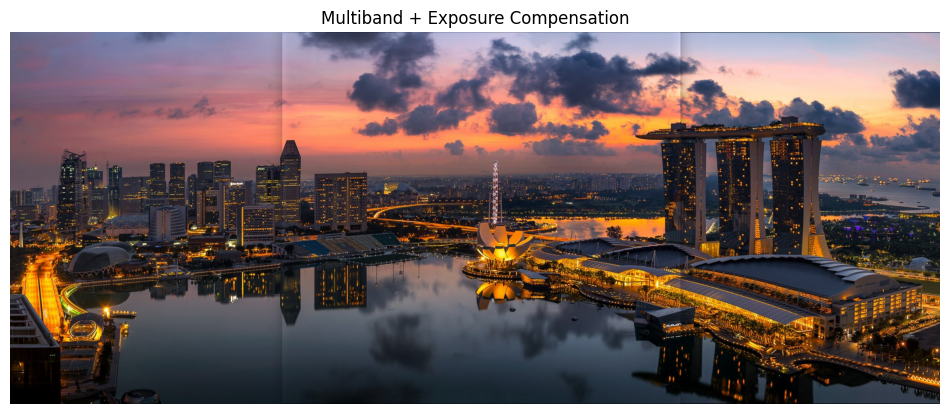

In [37]:
def match_exposure_simple(imgA, imgB, maskA, maskB):
    # compute mean in overlap
    overlap = (maskA > 0) & (maskB > 0)
    if overlap.sum() < 100:
        return imgA, imgB  # not enough overlap
    A_overlap = imgA[overlap]
    B_overlap = imgB[overlap]
    # per-channel gain for A to match B
    meanA = A_overlap.mean(axis=0)
    meanB = B_overlap.mean(axis=0)
    gain = (meanB + 1e-6) / (meanA + 1e-6)
    A_adj = np.clip(imgA.astype(np.float32) * gain, 0, 255).astype(np.uint8)
    return A_adj, imgB

def stitch_two_multiband_exposure(img1, img2, H, levels=5):
    A, B, mA, mB, _, _ = warp_pair_to_canvas(img1, img2, H)
    A_adj, B = match_exposure_simple(A, B, mA, mB)
    out = multiband_blend(A_adj, B, mA, mB, levels=levels)
    cv2.imwrite(str(OUTPUT_DIR/"multiband_exposure_pair.jpg"), out)
    return out

if 'H' in globals() and H is not None:
    multi_exp = stitch_two_multiband_exposure(imgs[0], imgs[1], H, levels=5)
    plt.figure(figsize=(12,6)); plt.imshow(cv2.cvtColor(multi_exp, cv2.COLOR_BGR2RGB))
    plt.title("Multiband + Exposure Compensation"); plt.axis('off'); plt.show()

#### Full multi-image pipeline with multiband blending

In [38]:
def stitch_sequence_with_blend(images, blend='multiband', levels=5, debug=True):
    pano = images[0]
    for i in range(1, len(images)):
        # features + homography
        kpA, desA = extract_sift(pano)
        kpB, desB = extract_sift(images[i])
        matches, _ = match_knn(desA, desB)
        H, status = compute_homography(kpA, kpB, matches)
        if H is None: 
            raise RuntimeError(f"Homography failed at step {i}")

        # visualize inliers
        inl_img = draw_inliers(pano, kpA, images[i], kpB, matches, status)
        show_and_save(inl_img, f"Inliers Step {i+1}", f"inliers_step_{i+1}.jpg")

        # blend
        if blend == 'multiband':
            pano = stitch_two_multiband_exposure(pano, images[i], H, levels=levels)
        elif blend == 'feather':
            A, B, mA, mB, _, _ = warp_pair_to_canvas(pano, images[i], H)
            A_adj, B = match_exposure_simple(A, B, mA, mB)
            pano, _, _ = feather_blend(A_adj, B, mA, mB)
        else:
            pano = stitch_two(pano, images[i], H)

        if debug:
            show_and_save(pano, f"Panorama Step {i+1} ({blend})", f"pano_{blend}_step_{i+1}.jpg")
    return pano

if len(imgs) >= 3:
    final_multiband = stitch_sequence_with_blend(imgs, blend='multiband', levels=5, debug=True)
    show_and_save(final_multiband, "Final Panorama (Multiband)", "final_pano_multiband.jpg")

#### Seam/energy heatmap in overlap (for diagnostics)

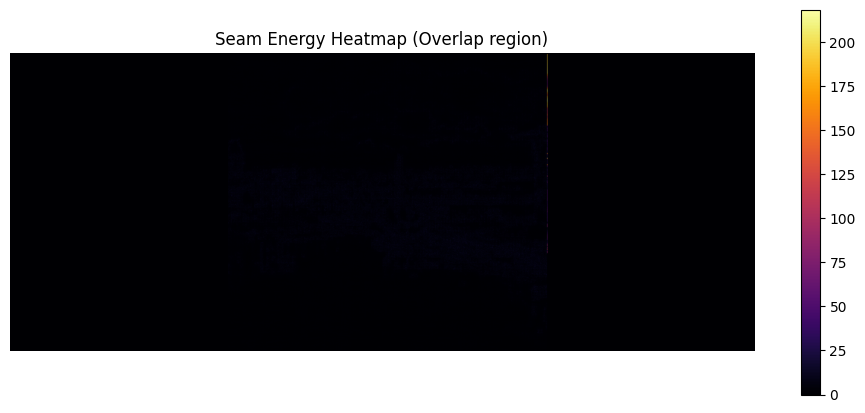

In [39]:
def seam_energy_heatmap(A, B, maskA, maskB):
    # L1 color difference in overlap
    overlap = (maskA > 0) & (maskB > 0)
    diff = np.abs(A.astype(np.float32) - B.astype(np.float32)).mean(axis=2)
    heat = np.zeros_like(diff)
    heat[overlap] = diff[overlap]
    return heat

if len(imgs) >= 2 and 'H' in globals() and H is not None:
    A, B, mA, mB, _, _ = warp_pair_to_canvas(imgs[0], imgs[1], H)
    heat = seam_energy_heatmap(A, B, mA, mB)
    plt.figure(figsize=(12,5))
    plt.imshow(heat, cmap='inferno')
    plt.title("Seam Energy Heatmap (Overlap region)"); plt.axis('off'); plt.colorbar(); plt.show()
    cv2.imwrite(str(OUTPUT_DIR/"seam_energy_heatmap.png"), (heat/heat.max()*255).astype(np.uint8))

#### Gallery: key visuals saved to disk in one figure

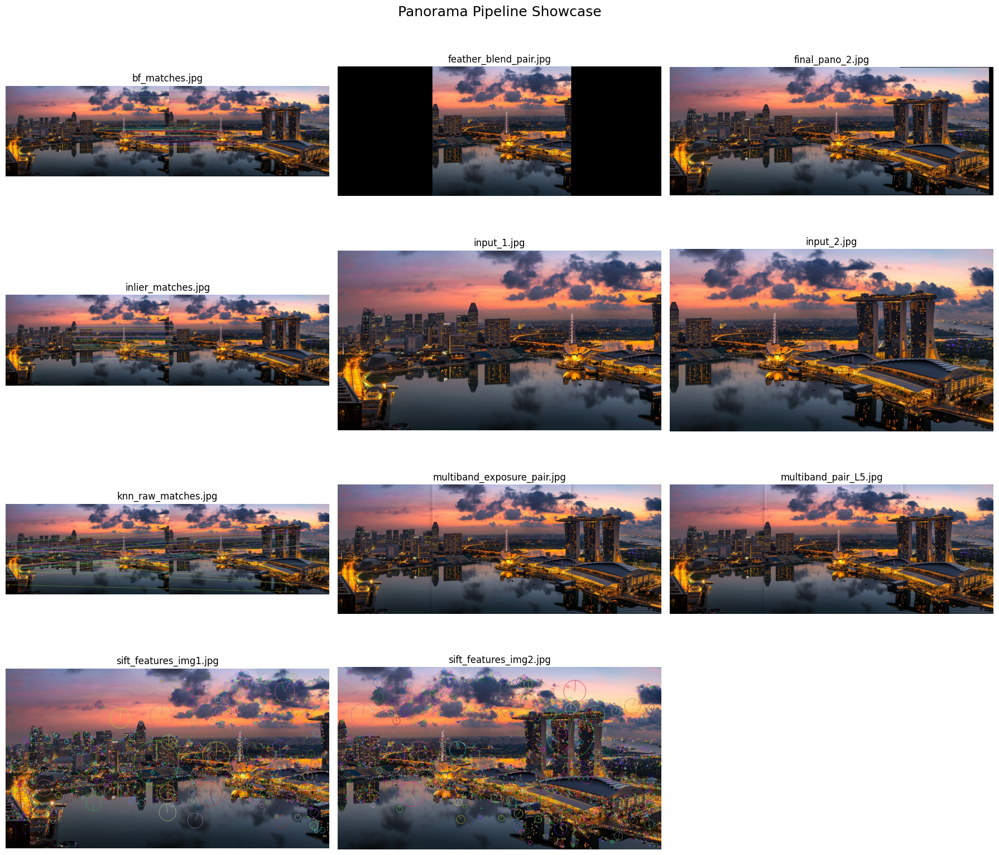

In [40]:
import glob

def gallery(patterns, cols=3, title="Showcase"):
    files = []
    for pat in patterns:
        files += glob.glob(str(OUTPUT_DIR/pat))
    files = sorted(files)
    if not files:
        print("No files matched for gallery."); return
    rows = int(np.ceil(len(files)/cols))
    plt.figure(figsize=(6*cols, 4*rows))
    for i, f in enumerate(files, 1):
        img = cv2.imread(f)
        plt.subplot(rows, cols, i)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(Path(f).name); plt.axis('off')
    plt.suptitle(title, fontsize=18)
    plt.tight_layout()
    plt.show()

# Put the most relevant artifacts together
gallery([
    "input_*.jpg",
    "sift_features_img*.jpg",
    "bf_matches.jpg",
    "knn_raw_matches.jpg",
    "knn_good_matches.jpg",
    "inlier_matches.jpg",
    "feather_blend_pair.jpg",
    "multiband_pair_L5.jpg",
    "multiband_exposure_pair.jpg",
    "pano_*step_*.jpg",
    "final_pano_*.jpg"
], cols=3, title="Panorama Pipeline Showcase")

#### Cylindrical projection (warp) helpers

In [41]:
import numpy as np
import cv2

def cylindrical_warp_image(img, f):
    """
    Cylindrical projection using focal length f (in pixels).
    x' = f * arctan(x/f)
    y' = f * y / sqrt(x^2 + f^2)
    Coordinates are centered at optical center (cx, cy).
    Returns: warped image and valid mask.
    """
    h, w = img.shape[:2]
    cx = w / 2.0
    cy = h / 2.0

    # grid of destination cylindrical coords
    y_i, x_i = np.indices((h, w))
    x_c = x_i - cx
    y_c = y_i - cy

    # inverse mapping from cyl -> image
    theta = x_c / f
    h_ = y_c / np.sqrt(x_c**2 + f**2)

    x_s = np.tan(theta) * f + cx
    y_s = h_ * np.sqrt(x_c**2 + f**2) + cy  # simplifies to y_c

    # map only valid coords
    x_s = x_s.astype(np.float32)
    y_s = y_s.astype(np.float32)

    warped = cv2.remap(img, x_s, y_s, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=0)

    # mask of valid pixels (where mapping falls inside original image)
    valid = (x_s >= 0) & (x_s < w) & (y_s >= 0) & (y_s < h)
    mask = (valid * 255).astype(np.uint8)
    return warped, mask

def auto_focal_length_from_width(width, fov_deg=50.0):
    # f = W / (2 * tan(FOV/2))
    f = width / (2.0 * np.tan(np.deg2rad(fov_deg/2.0)))
    return float(f)

#### Preprocess images with cylindrical projection

In [42]:
def preprocess_images_cylindrical(images, f=None, fov_deg=50.0):
    """
    If f is None, estimate from width & FOV.
    Returns list of warped images (cylindrical).
    """
    out = []
    for im in images:
        if f is None:
            f_est = auto_focal_length_from_width(im.shape[1], fov_deg=fov_deg)
        else:
            f_est = f
        warped, mask = cylindrical_warp_image(im, f_est)
        out.append(warped)
    return out

#### Homography cache (JSON) utilities

In [43]:
import json, hashlib
from pathlib import Path

CACHE_PATH = OUTPUT_DIR / "homography_cache.json"

def image_sha1(img):
    ok, buf = cv2.imencode(".jpg", img)
    if not ok:  # fallback: raw bytes
        data = img.tobytes()
    else:
        data = buf.tobytes()
    return hashlib.sha1(data).hexdigest()

def load_cache(path=CACHE_PATH):
    if Path(path).exists():
        with open(path, "r") as f:
            return json.load(f)
    return {}

def save_cache(cache, path=CACHE_PATH):
    with open(path, "w") as f:
        json.dump(cache, f, indent=2)

def get_cached_H(cache, hA, hB):
    key = f"{hA}|{hB}"
    if key in cache:
        H = np.array(cache[key]["H"], dtype=np.float32)
        return H
    return None

def set_cached_H(cache, hA, hB, H):
    key = f"{hA}|{hB}"
    cache[key] = {"H": H.tolist()}

#### Compute-or-cache Homography wrapper

In [44]:
def compute_or_cached_homography(imgA, imgB, kpA, kpB, desA, desB, cache=None, ratio=0.75, ransac_thresh=4.0):
    hA = image_sha1(imgA)
    hB = image_sha1(imgB)
    if cache is not None:
        Hc = get_cached_H(cache, hA, hB)
        if Hc is not None:
            return Hc, None, None, (hA, hB), True  # cached

    # compute fresh via KNN -> RANSAC
    good, raw = match_knn(desA, desB, ratio=ratio)
    H, status = compute_homography(kpA, kpB, good, ransac_thresh)
    if H is None:
        raise RuntimeError("Homography could not be computed.")
    if cache is not None:
        set_cached_H(cache, hA, hB, H)
    return H, status, good, (hA, hB), False

#### End-to-end pair stitching with cylindrical & cache & blend

In [45]:
def stitch_pair_advanced(imgA, imgB, use_cylindrical=False, f=None, blend='multiband', levels=5,
                         cache=None, debug=True, step_tag="pair"):
    # Optional cylindrical pre-warp per pair
    A = imgA.copy()
    B = imgB.copy()
    if use_cylindrical:
        if f is None:
            f = auto_focal_length_from_width(B.shape[1], 50.0)
        A, _ = cylindrical_warp_image(A, f)
        B, _ = cylindrical_warp_image(B, f)

    # features
    kpA, desA = extract_sift(A)
    kpB, desB = extract_sift(B)

    # H from cache or compute
    H, status, matches, (hA, hB), from_cache = compute_or_cached_homography(A, B, kpA, kpB, desA, desB, cache=cache)

    # visualize inliers (if computed fresh)
    if (status is not None) and debug:
        inlier_img = draw_inliers(A, kpA, B, kpB, matches, status)
        show_and_save(inlier_img, f"Inliers {step_tag}", f"inliers_{step_tag}.jpg")

    # stitch with selected blend
    if blend == 'multiband':
        pano = stitch_two_multiband_exposure(A, B, H, levels=levels)
    elif blend == 'feather':
        AA, BB, mA, mB, _, _ = warp_pair_to_canvas(A, B, H)
        AA, BB = match_exposure_simple(AA, BB, mA, mB)
        pano, _, _ = feather_blend(AA, BB, mA, mB)
    else:
        pano = stitch_two(A, B, H)

    return pano, H, (hA, hB), from_cache

#### Full sequence stitching (advanced) with options

In [46]:
def stitch_sequence_advanced(images, use_cylindrical=False, f=None, blend='multiband', levels=5,
                             debug=True, cache=None, run_dir=None):
    if use_cylindrical:
        images = preprocess_images_cylindrical(images, f=f)

    pano = images[0]
    for i in range(1, len(images)):
        pano, H, keypair, cached = stitch_pair_advanced(
            pano, images[i],
            use_cylindrical=False,  # already applied globally above
            f=f,
            blend=blend,
            levels=levels,
            cache=cache,
            debug=debug,
            step_tag=f"step_{i+1}"
        )
        if run_dir is not None:
            cv2.imwrite(str(run_dir/f"pano_{i+1}.jpg"), pano)
        if debug:
            show_and_save(pano, f"Panorama step {i+1} ({'cached' if cached else 'computed'})",
                          f"pano_step_{i+1}.jpg")
    return pano

#### Gather visual artifacts from OUTPUT_DIR to show as a gallery

In [47]:
import glob

def collect_visuals_for_gallery(run_dir=None):
    base = OUTPUT_DIR if run_dir is None else run_dir
    pats = [
        "input_*.jpg",
        "sift_features_img*.jpg",
        "bf_matches.jpg",
        "knn_raw_matches.jpg",
        "knn_good_matches.jpg",
        "inlier*.jpg",
        "feather_*pair*.jpg",
        "multiband_pair_*.jpg",
        "multiband_exposure_pair.jpg",
        "pano_*step_*.jpg",
        "final_pano_*.jpg"
    ]
    files = []
    for p in pats:
        files += glob.glob(str(base/p))
    return sorted(files)

#### Gradio UI: build app

In [48]:
import gradio as gr
import time

def imread_gr_file(fileobj):
    if hasattr(fileobj, "read"):  # old behavior (file-like)
        data = fileobj.read()
        arr = np.frombuffer(data, np.uint8)
        img = cv2.imdecode(arr, cv2.IMREAD_COLOR)
    else:  # new behavior (NamedString with .name path)
        img = cv2.imread(fileobj.name, cv2.IMREAD_COLOR)
    return img

def run_gradio_pipeline(files, blend, levels, use_cyl, focal, debug, cache_in):
    # Prepare run directory for this session
    ts = time.strftime("%Y%m%d_%H%M%S")
    run_dir = OUTPUT_DIR / f"run_{ts}"
    run_dir.mkdir(parents=True, exist_ok=True)

    # Load images
    imgs_local = []
    for fobj in files:
        img = imread_gr_file(fobj)
        imgs_local.append(img)
    # Save inputs for record
    for i, im in enumerate(imgs_local):
        cv2.imwrite(str(run_dir/f"input_{i+1}.jpg"), im)

    # Load cache if provided
    cache = load_cache()  # start from default cache on disk
    if cache_in is not None and len(cache_in) > 0:
        try:
            with open(cache_in.name, "r") as f:
                user_cache = json.load(f)
            cache.update(user_cache)
        except Exception as e:
            print("Cache load error:", e)

    # Stitch
    pano = stitch_sequence_advanced(
        imgs_local,
        use_cylindrical=use_cyl,
        f=(None if focal <= 0 else float(focal)),
        blend=blend,
        levels=int(levels),
        debug=bool(debug),
        cache=cache,
        run_dir=run_dir
    )

    # Save final outputs
    final_path = run_dir / f"final_pano_{blend}.jpg"
    cv2.imwrite(str(final_path), pano)
    # Save cache
    cache_path = run_dir / "homography_cache.json"
    save_cache(cache, cache_path)

    # Collect visuals
    visuals = collect_visuals_for_gallery(run_dir=run_dir)

    # Prepare gallery items (list of file paths)
    return pano[..., ::-1], visuals, str(cache_path)  # convert BGR->RGB for gr.Image

# Build UI
with gr.Blocks(title="Panorama Builder (Cylindrical + Multiband + Cache)") as demo:
    gr.Markdown("## Panorama Builder — with Cylindrical Projection, Blending & Homography Cache")

    with gr.Row():
        files_in = gr.Files(label="Upload 2–8 images", file_count="multiple", file_types=["image"])
    with gr.Row():
        blend_dd = gr.Dropdown(choices=["direct", "feather", "multiband"], value="multiband", label="Blend Type")
        levels_sl = gr.Slider(3, 8, value=5, step=1, label="Multiband Levels")
        debug_cb = gr.Checkbox(value=True, label="Save Debug Visuals")
    with gr.Row():
        cyl_cb = gr.Checkbox(value=False, label="Use Cylindrical Projection")
        focal_sl = gr.Slider(0, 2000, value=0, step=10, label="Focal length f (px); 0 = auto")
    with gr.Row():
        cache_file_in = gr.File(label="(Optional) Load Homography Cache JSON")
    with gr.Row():
        run_btn = gr.Button("Build Panorama")

    with gr.Row():
        pano_out = gr.Image(label="Panorama", type="numpy")
    with gr.Row():
        gallery_out = gr.Gallery(label="Visual Artifacts (saved per run)", columns=3, height=400)
    with gr.Row():
        cache_file_out = gr.File(label="Saved Homography Cache (download)")

    run_btn.click(
        fn=run_gradio_pipeline,
        inputs=[files_in, blend_dd, levels_sl, cyl_cb, focal_sl, debug_cb, cache_file_in],
        outputs=[pano_out, gallery_out, cache_file_out]
    )

print("Gradio app ready. Launch with: demo.launch()")

Gradio app ready. Launch with: demo.launch()


#### Launch Gradio

In [49]:
# Note: In some environments you may need `demo.launch(share=True)` to get a public URL.
# demo.launch()

#### CLI-style quick test using cylindrical + multiband + cache

In [50]:
def quick_test_with_options(folder="./samples", use_cyl=False, f=0, blend="multiband", levels=5, debug=True):
    imgs_local, paths = load_images(folder)
    cache = load_cache()
    pano = stitch_sequence_advanced(
        imgs_local,
        use_cylindrical=use_cyl,
        f=(None if f <= 0 else float(f)),
        blend=blend,
        levels=levels,
        debug=debug,
        cache=cache,
        run_dir=OUTPUT_DIR / "cli_run"
    )
    out = OUTPUT_DIR / f"cli_final_{blend}.jpg"
    cv2.imwrite(str(out), pano)
    save_cache(cache)  # persist to default cache path
    print(f"CLI final saved: {out}")
    return pano

# Example:
# quick_test_with_options("./samples", use_cyl=True, f=800, blend="multiband", levels=5, debug=True)

#### Tiny helper: summarize cache contents

In [51]:
def summarize_cache(path=CACHE_PATH):
    cache = load_cache(path)
    print(f"Cache entries: {len(cache)}")
    for k, v in list(cache.items())[:5]:
        print(" ", k, "-> H shape:", np.array(v["H"]).shape)
    return cache

# summarize_cache()

#### Visual demo: cylindrical vs planar (first two images)

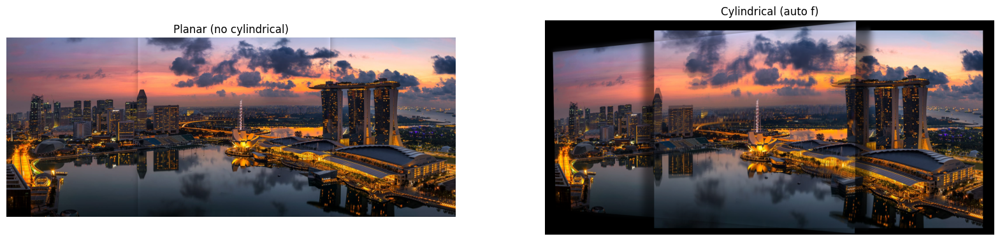

In [52]:
if len(imgs) >= 2:
    A = imgs[0]; B = imgs[1]
    f_auto = auto_focal_length_from_width(B.shape[1], 50.0)
    A_cyl, _ = cylindrical_warp_image(A, f_auto)
    B_cyl, _ = cylindrical_warp_image(B, f_auto)

    # planar
    kp1p, d1p = extract_sift(A)
    kp2p, d2p = extract_sift(B)
    goodp, _ = match_knn(d1p, d2p)
    Hp, sp = compute_homography(kp1p, kp2p, goodp)

    pano_planar = stitch_two_multiband_exposure(A, B, Hp, levels=5)

    # cylindrical
    kp1c, d1c = extract_sift(A_cyl)
    kp2c, d2c = extract_sift(B_cyl)
    goodc, _ = match_knn(d1c, d2c)
    Hc, sc = compute_homography(kp1c, kp2c, goodc)
    pano_cyl = stitch_two_multiband_exposure(A_cyl, B_cyl, Hc, levels=5)

    fig, axs = plt.subplots(1,2, figsize=(20,8))
    axs[0].imshow(cv2.cvtColor(pano_planar, cv2.COLOR_BGR2RGB)); axs[0].set_title("Planar (no cylindrical)"); axs[0].axis('off')
    axs[1].imshow(cv2.cvtColor(pano_cyl, cv2.COLOR_BGR2RGB)); axs[1].set_title("Cylindrical (auto f)"); axs[1].axis('off')
    plt.show()

#### Export a compact "model" artifact (parameters + cache pointer)

In [53]:
MODEL_META_PATH = OUTPUT_DIR / "model_meta.json"

def save_model_meta(blend="multiband", levels=5, use_cyl=False, focal=0, cache_path=str(CACHE_PATH)):
    meta = {
        "blend": blend,
        "multiband_levels": int(levels),
        "use_cylindrical": bool(use_cyl),
        "focal_length_px": float(focal),
        "cache_json": str(cache_path)
    }
    with open(MODEL_META_PATH, "w") as f:
        json.dump(meta, f, indent=2)
    print("Saved model meta to", MODEL_META_PATH)
    return MODEL_META_PATH

# save_model_meta(blend="multiband", levels=5, use_cyl=True, focal=800, cache_path=str(CACHE_PATH))

#### Load "model" meta and run prediction (batch)

In [54]:
def predict_with_model_meta(meta_path=MODEL_META_PATH, folder="./samples"):
    with open(meta_path, "r") as f:
        meta = json.load(f)
    imgs_local, _ = load_images(folder)
    cache = load_cache(meta["cache_json"]) if Path(meta["cache_json"]).exists() else load_cache()
    pano = stitch_sequence_advanced(
        imgs_local,
        use_cylindrical=meta["use_cylindrical"],
        f=(None if meta["focal_length_px"] <= 0 else float(meta["focal_length_px"])),
        blend=meta["blend"],
        levels=int(meta["multiband_levels"]),
        debug=True,
        cache=cache,
        run_dir=OUTPUT_DIR / "predict_run"
    )
    out = OUTPUT_DIR / "predict_pano.jpg"
    cv2.imwrite(str(out), pano)
    print("Prediction panorama saved to", out)
    return out

# predict_with_model_meta(MODEL_META_PATH, "./samples")

#### Gradio: quick launcher line (so you remember)

In [55]:
demo.launch()   # or demo.launch(share=True)

* Running on local URL:  http://127.0.0.1:7860
* To create a public link, set `share=True` in `launch()`.
